[__<< Feature Engineering__](./04_Divvy_feature_engineering.ipynb) | [__Home__](../README.md)

# Divvy: Bike Sharing Forecast
## XGBoost: Modeling & Validation

__Dataset:__ [Divvy Data](https://divvybikes.com/system-data) \
__Author:__ [Dmitry Luchkin](https://www.linkedin.com/in/dmitry-luchkin/) \
__Date:__ April 2025

> **Attention**
>
> The data utilized in this project were sourced from the official public data provided by Divvy. All analysis, results, and insights presented in this notebook were conducted and formulated by Dmitry Luchkin. I declare that I am not affiliated with Divvy, Lyft, the City of Chicago, or any associated organizations. The views and interpretations expressed herein are solely my own and do not represent the positions or policies of these entities.

### Notebooks <a class="anchor" name='notebooks'></a>

+ [Initial Data Exploration](./01_Divvy_data_exploration.ipynb)
+ [Data Cleaning](./02_Divvy_data_cleaning.ipynb)
+ [Exploratory Data Analysis](./03_Divvy_exploratory_data_analysis.ipynb)
+ [Feature Engineering](./04_Divvy_feature_engineering.ipynb)
+ Modeling & Validation:
  - __[XGBoost: Modeling & Validation](./05.1_Divvy_modeling_xgboost.ipynb)__
  - [RNN: Modeling & Validation](./05.2_Divvy_modeling_rnn.ipynb)
  - [ARIMAX: Modeling & Validation](./05.3_Divvy_modeling_arimax.ipynb)
  - [Ensemble: Modeling & Validation](./05.4_Divvy_modeling_ensemble.ipynb)
+ [Forecasting](./06_Divvy_forecasting.ipynb)

### Import Libraries <a name='import-libraries'></a>

In [1]:
import os 
import sys
import pickle
import warnings

import pandas as pd
import numpy as np
import statsmodels as sm
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import mean_absolute_error
from sktime.split import temporal_train_test_split
from sktime.utils.plotting import plot_series

warnings.filterwarnings("ignore")

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
sys.path.append('../02_scripts/')

# import project code
from utils.plotting import notebook_setup
from utils.plotting.notebook_setup import TRAIN_COLOR, TEST_COLOR, FORECAST_COLOR
from utils.plotting.viz import plot_trips, plot_feature_importance, distplot, check_residuals, plot_combos
from utils.model.tools import add_lags, make_features, get_best_model
from utils.model.seed import set_seed
from utils.model.xgb import train_validate_xgb, find_best_combo, xgb_run

2025-04-22 21:53:41.212756: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Loading Data <a name='loading-data'></a>

In [3]:
data = pd.read_pickle("../00_data/02_processed/divvy_data_processed_final.pkl")

In [4]:
data.columns

Index(['casual_regular_bike', 'member_regular_bike', 'casual_electric_bike',
       'member_electric_bike', 'member_total', 'casual_total',
       'electric_total', 'regular_total', 'total_rides', 'is_holiday', 'year',
       'quarter', 'month', 'day', 'season', 'weekday', 'temp', 'feelslike',
       'humidity', 'precip', 'precipprob', 'precipcover', 'snow', 'snowdepth',
       'windgust', 'windspeed', 'winddir', 'sealevelpressure', 'cloudcover',
       'visibility', 'Clear', 'Freezing Drizzle/Freezing Rain', 'Ice',
       'Overcast', 'Partially cloudy', 'Rain', 'Snow'],
      dtype='object')

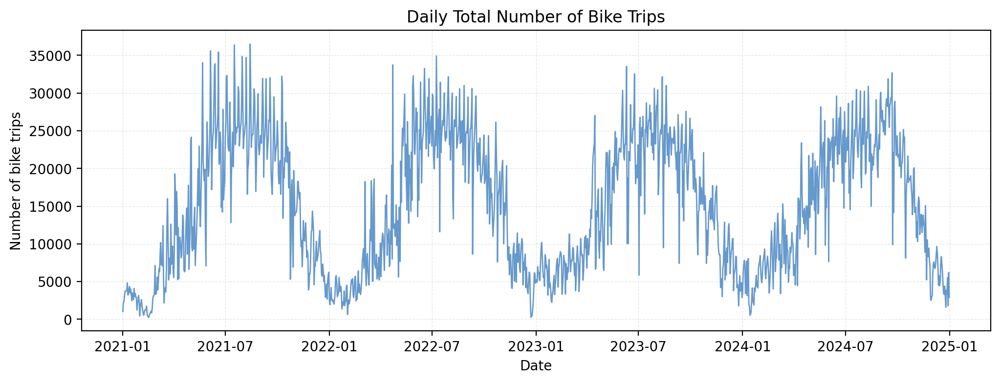

In [5]:
plt.figure(figsize=(12, 4))

plt.plot(data["total_rides"], lw=1, color=TRAIN_COLOR)
plt.title("Daily Total Number of Bike Trips")
plt.xlabel("Date")
plt.ylabel("Number of bike trips")

plt.show()

In [6]:
train, test = temporal_train_test_split(data, test_size=0.25)

# save sets for another models
train_filename = "../00_data/02_processed/divvy_train.pkl"
test_filename = "../00_data/02_processed/divvy_test.pkl"
pickle.dump(train, open(train_filename, "wb"))
pickle.dump(test, open(test_filename, "wb"))

#### Daily total number of bike trips

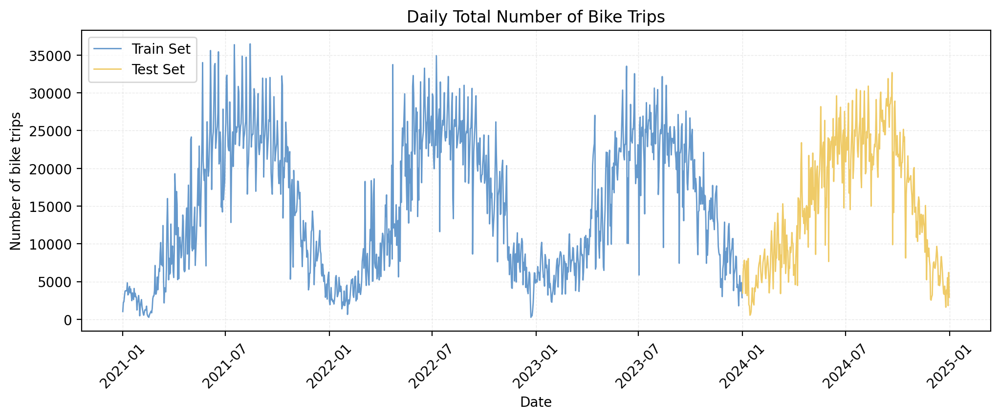

In [7]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))
plot_trips(ax, train["total_rides"], test["total_rides"], title="Daily Total Number of Bike Trips")
plt.show()

#### Daily sub-total number of bike trips

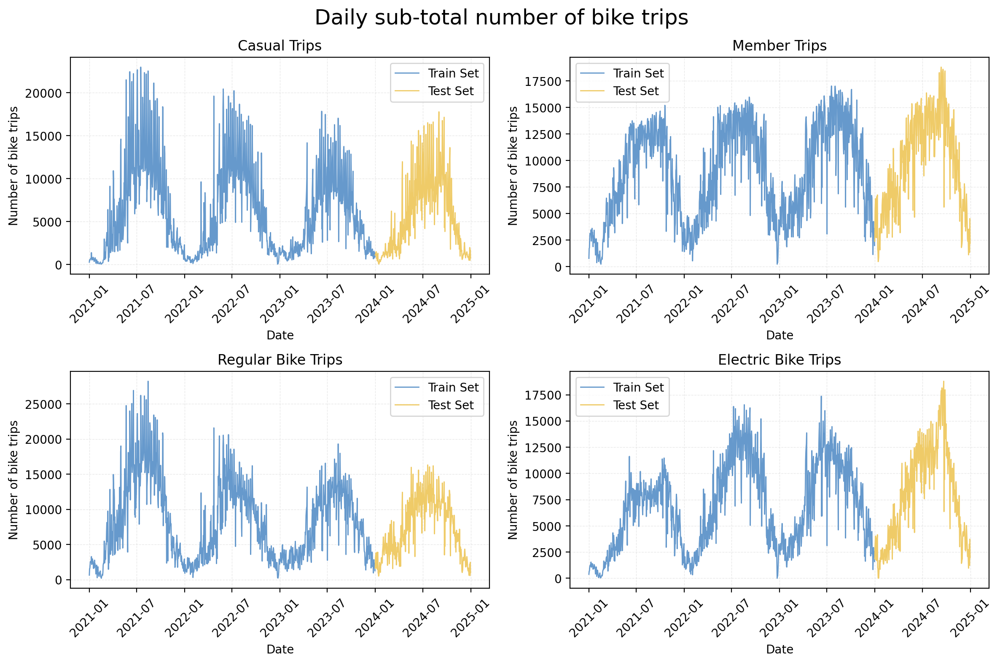

In [8]:
_, ax = plt.subplots(2, 2, figsize=(12, 8))
plot_trips(ax[0, 0], train["casual_total"], test["casual_total"], title="Casual Trips")
plot_trips(ax[0, 1], train["member_total"], test["member_total"], title="Member Trips")
plot_trips(ax[1, 0], train["regular_total"], test["regular_total"], title="Regular Bike Trips")
plot_trips(ax[1, 1], train["electric_total"], test["electric_total"], title="Electric Bike Trips")
plt.suptitle("Daily sub-total number of bike trips", fontsize=18)
plt.tight_layout()
plt.show()

#### Daily number of trips by bike type and user type

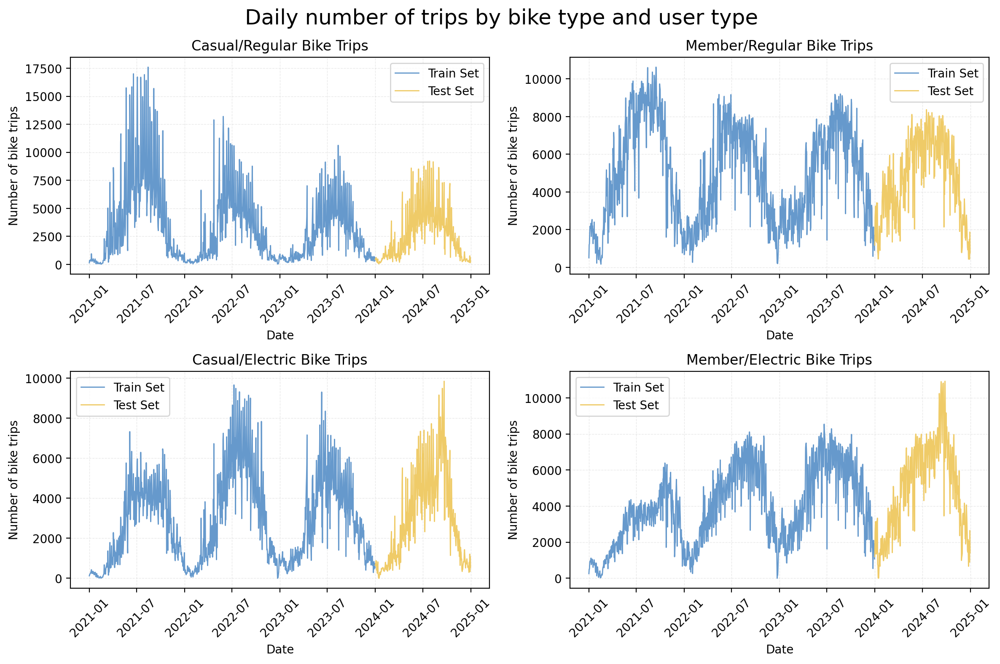

In [9]:
_, ax = plt.subplots(2, 2, figsize=(12, 8))
plot_trips(ax[0, 0], train["casual_regular_bike"], test["casual_regular_bike"], title="Casual/Regular Bike Trips")
plot_trips(ax[0, 1], train["member_regular_bike"], test["member_regular_bike"], title="Member/Regular Bike Trips")
plot_trips(ax[1, 0], train["casual_electric_bike"], test["casual_electric_bike"], title="Casual/Electric Bike Trips")
plot_trips(ax[1, 1], train["member_electric_bike"], test["member_electric_bike"], title="Member/Electric Bike Trips")
plt.suptitle("Daily number of trips by bike type and user type", fontsize=18)
plt.tight_layout()
plt.show()

### Hierarchical Forecasting

Hierarchical forecasting aims to produce forecasts that are both accurate and consistent across levels of the hierarchy.

Two primary approaches are used for hierarchical forecasting:

+ __Top-Down Approach__
  The top-down method begins by forecasting the top-level (aggregate) series. These forecasts are then disaggregated downward based on historical proportions or predictive models.

+ __Bottom-Up Approach__
  The bottom-up method starts by forecasting the most granular (lowest-level) series independently. These forecasts are then aggregated upward to obtain predictions for higher levels in the hierarchy.

In [10]:
# Keep for analysis
xgb_mae_scores = {
    "bottom-up": {
        "mae": {
            "total_rides": None,
            "regular_total": None,
            "electric_total": None,
            "casual_total": None,
            "member_total": None,
            "casual_regular_bike": None,
            "member_regular_bike": None,
            "casual_electric_bike": None,
            "member_electric_bike": None
            }},
    "top-down": {
        "mae":{
            "total_rides": None,
            "regular_total": None,
            "electric_total": None,
            "casual_total": None,
            "member_total": None,
            "casual_regular_bike": None,
            "member_regular_bike": None,
            "casual_electric_bike": None,
            "member_electric_bike": None
            }}
}

In [11]:
# set seed
set_seed(42)

Seed 42 has been set.


---
#### Top-Down

![Top-Down Approach](./00_images/top_down.png)


Step 1: Analyzing distribution of `total_rides`

[`total_rides`]
Skewness: 0.18

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis: -1.18

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


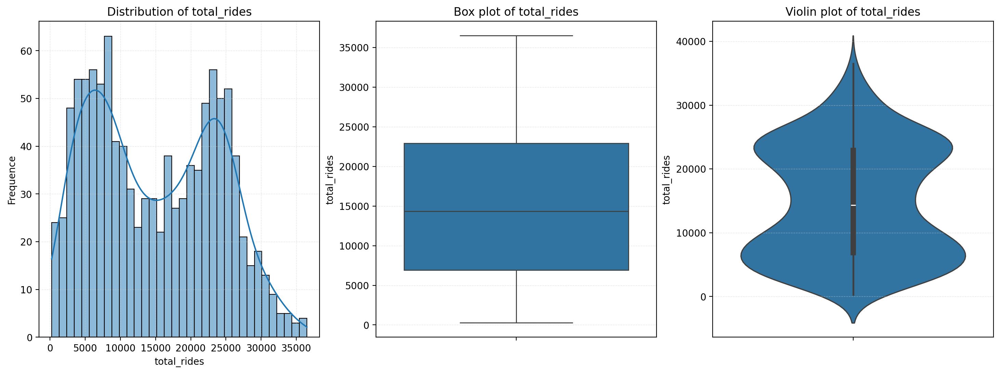


Step 2: Searching for best feature + transformation combo...


  0%|          | 0/26 [00:00<?, ?it/s]


BEST MODELS FOR `total_rides`

Total combinations: 26
Informative Lags: [1, 2, 3, 6] (threshold = 0.2)

------------------------------------------------------------------------------------------------------------
| N. | Combination                                        | Transformation       | Lags       | MAE        |
------------------------------------------------------------------------------------------------------------
| 1  | time_index, lags                                   | boxcox (λ=0.5809)    | Yes        | 2745.41    |
------------------------------------------------------------------------------------------------------------
| 2  | time_index, timestamps                             | -                    | No         | 3044.38    |
------------------------------------------------------------------------------------------------------------
| 3  | time_index, holidays                               | -                    | No         | 7456.81    |
-----------------------

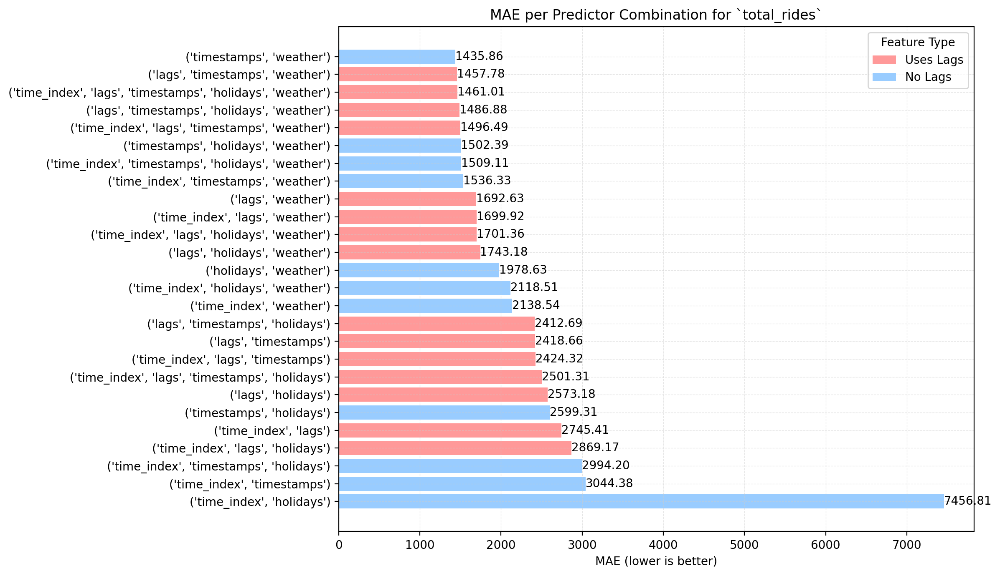


Step 4: Extracting best model based on MAE

Step 5: Forecast visualization and feature importance


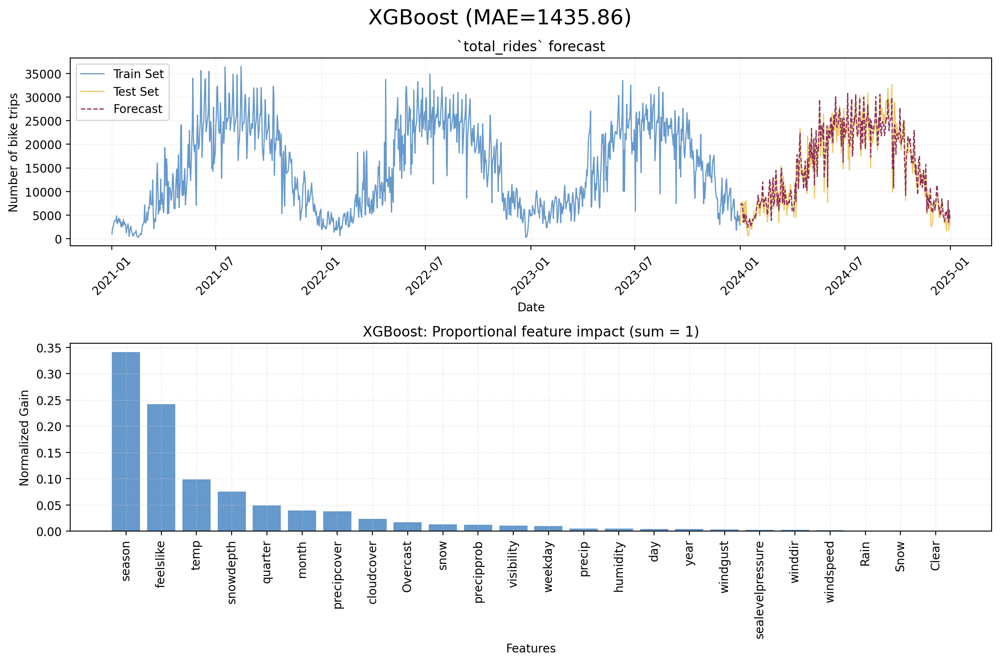


Step 6: Residual analysis


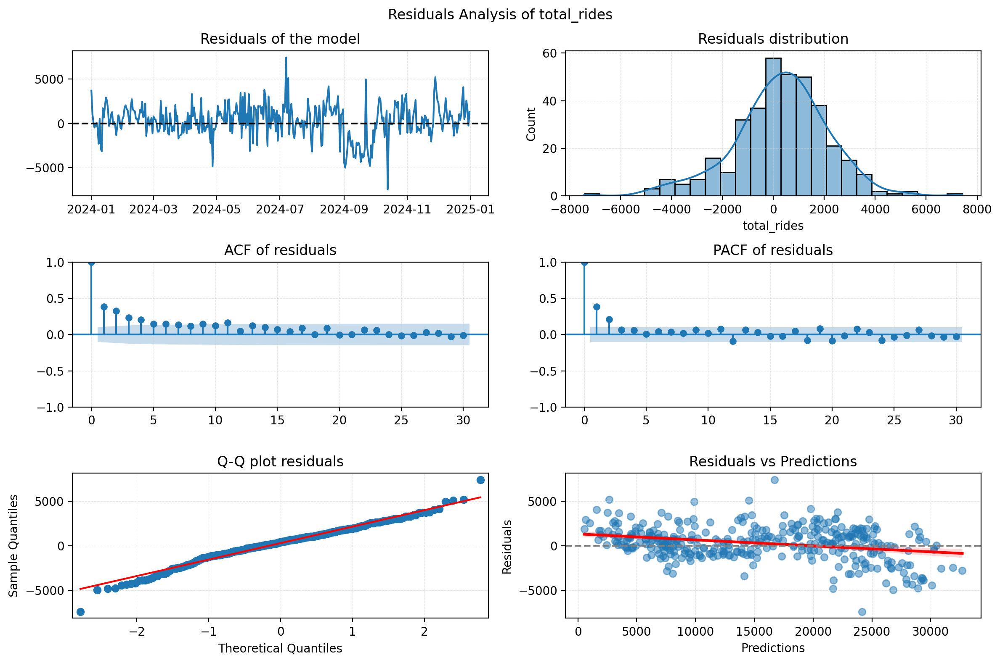


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10 172.8214     0.0000
Residuals are autocorrelated

-- Dickey–Fuller test --
ADF Statistic: -8.5336400954115
p-value: 1.0217565660187652e-13
Time series is stationary

-- KPSS test --
ADF Statistic: 0.12010539757356842
p-value: 0.09795296745635478
Time series is stationary


In [12]:
total_rides_predictors, total_rides_model = xgb_run(train, test, "total_rides")

In [13]:
xgb_mae_scores['top-down']['mae']['total_rides'] = total_rides_model["test_mae"]

##### Down-level forecast distribution

Calculate the proportions for each lower-level node based on historical data.

In [14]:
train_totals = train[['casual_regular_bike', 'member_regular_bike', 'casual_electric_bike',
       'member_electric_bike']].sum()
props =  train_totals / train_totals.sum()
props

casual_regular_bike    0.2164
member_regular_bike    0.3312
casual_electric_bike   0.1902
member_electric_bike   0.2621
dtype: float64

In [15]:
total_forecast = pd.Series(total_rides_model["test_forecast"], index=test.index)
total_forecast.head()

2024-01-01   7,160.0068
2024-01-02   7,347.9351
2024-01-03   7,294.4912
2024-01-04   7,349.0845
2024-01-05   7,055.9790
Freq: D, dtype: float32

Distribute the top-level forecast down proportionally to these shares.

In [16]:
td_bottom_forecast = pd.DataFrame({
    node: total_forecast * prop for node, prop in props.items()
})
td_bottom_forecast.head()

,casual_regular_bike,member_regular_bike,casual_electric_bike,member_electric_bike
2024-01-01,"1,549.6628","2,371.4380","1,362.0482","1,876.8579"
2024-01-02,"1,590.3368","2,433.6809","1,397.7977","1,926.1196"
2024-01-03,"1,578.7698","2,415.9800","1,387.6311","1,912.1104"
2024-01-04,"1,590.5856","2,434.0618","1,398.0165","1,926.4209"
2024-01-05,"1,527.1478","2,336.9834","1,342.2589","1,849.5890"


In [17]:
td_casual_regular_mae = mean_absolute_error(test["casual_regular_bike"], td_bottom_forecast["casual_regular_bike"])
td_member_regular_mae = mean_absolute_error(test["member_regular_bike"], td_bottom_forecast["member_regular_bike"])
td_casual_electric_mae = mean_absolute_error(test["casual_electric_bike"], td_bottom_forecast["casual_electric_bike"])
td_member_electric_mae = mean_absolute_error(test["member_electric_bike"], td_bottom_forecast["member_electric_bike"])

In [18]:
xgb_mae_scores['top-down']['mae']['casual_regular_bike'] = td_casual_regular_mae
xgb_mae_scores['top-down']['mae']['member_regular_bike'] = td_member_regular_mae
xgb_mae_scores['top-down']['mae']['casual_electric_bike'] = td_casual_electric_mae
xgb_mae_scores['top-down']['mae']['member_electric_bike'] = td_member_electric_mae

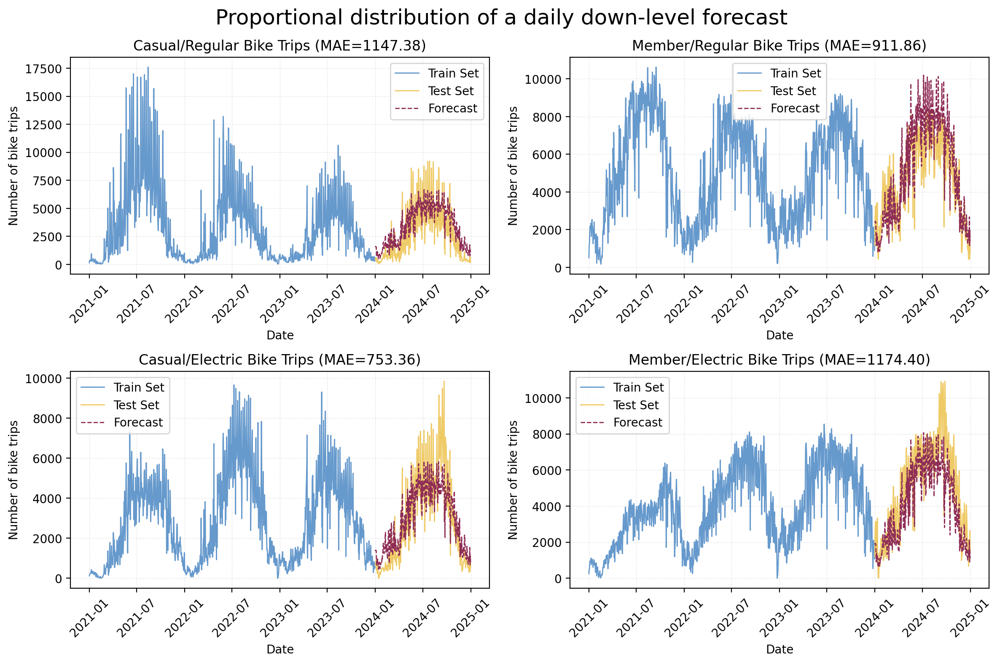

In [19]:
fig, ax = plt.subplots(2, 2, figsize=(12, 8), facecolor='white')

plot_trips(train=train["casual_regular_bike"], 
                    test=test["casual_regular_bike"],
                    forecast=td_bottom_forecast["casual_regular_bike"],
                    title=f"Casual/Regular Bike Trips (MAE={td_casual_regular_mae:.2f})",
                    ax=ax[0, 0])

plot_trips(train=train["member_regular_bike"], 
                    test=test["member_regular_bike"],
                    forecast=td_bottom_forecast["member_regular_bike"],
                    title=f"Member/Regular Bike Trips (MAE={td_member_regular_mae:.2f})",
                    ax=ax[0, 1])

plot_trips(train=train["casual_electric_bike"], 
                    test=test["casual_electric_bike"],
                    forecast=td_bottom_forecast["casual_electric_bike"],
                    title=f"Casual/Electric Bike Trips (MAE={td_casual_electric_mae:.2f})",
                    ax=ax[1, 0])

plot_trips(train=train["member_electric_bike"], 
                    test=test["member_electric_bike"],
                    forecast=td_bottom_forecast["member_electric_bike"],
                    title=f"Member/Electric Bike Trips (MAE={td_member_electric_mae:.2f})",
                    ax=ax[1, 1])

plt.suptitle("Proportional distribution of a daily down-level forecast", fontsize=18)
plt.tight_layout()
plt.show()

##### Sub-Total forecast distribution (Bottom-Up for cross-level)

In [20]:
td_bu_casual_total_forecast = td_bottom_forecast["casual_regular_bike"] + \
                                td_bottom_forecast["casual_electric_bike"]
td_bu_member_total_forecast = td_bottom_forecast["member_regular_bike"] + \
                                td_bottom_forecast["member_electric_bike"]
td_bu_electric_total_forecast = td_bottom_forecast["member_electric_bike"] + \
                                  td_bottom_forecast["casual_electric_bike"]
td_bu_regular_total_forecast = td_bottom_forecast["member_regular_bike"] + \
                                 td_bottom_forecast["casual_regular_bike"]

td_bu_casual_total_mae = mean_absolute_error(test["casual_total"], td_bu_casual_total_forecast)
td_bu_member_total_mae = mean_absolute_error(test["member_total"], td_bu_member_total_forecast)
td_bu_electric_total_mae = mean_absolute_error(test["electric_total"], td_bu_electric_total_forecast)
td_bu_regular_total_mae = mean_absolute_error(test["regular_total"], td_bu_regular_total_forecast)

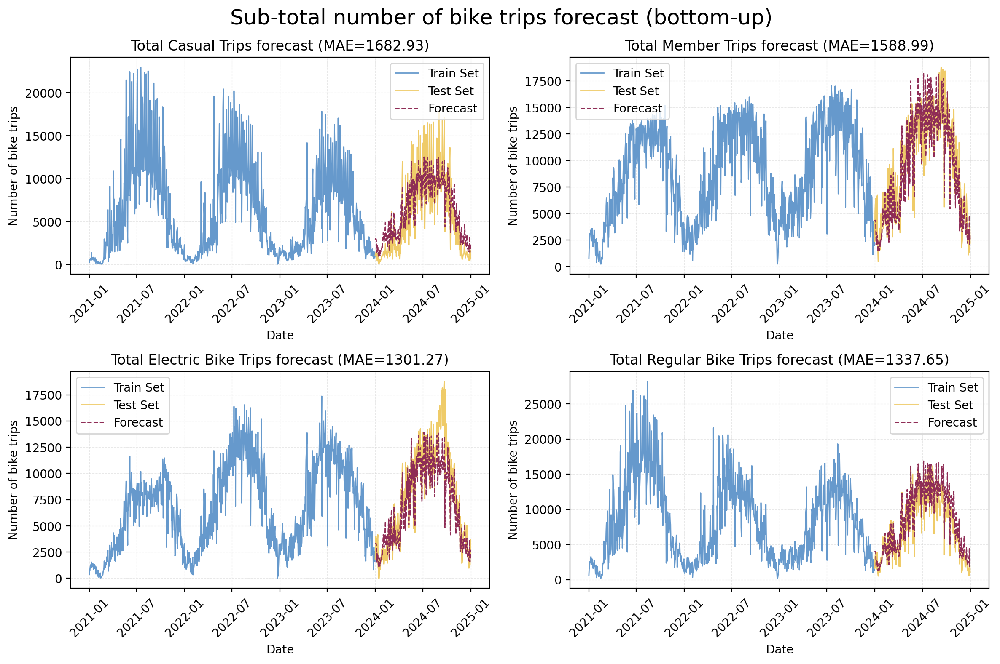

In [21]:
fig, ax = plt.subplots(2, 2, figsize=(12, 8))

plot_trips(train=train["casual_total"], 
                    test=test["casual_total"],
                    forecast=td_bu_casual_total_forecast,
                    title=f"Total Casual Trips forecast (MAE={td_bu_casual_total_mae:.2f})",
                    ax=ax[0, 0])

plot_trips(train=train["member_total"], 
                    test=test["member_total"],
                    forecast=td_bu_member_total_forecast,
                    title=f"Total Member Trips forecast (MAE={td_bu_member_total_mae:.2f})",
                    ax=ax[0, 1])

plot_trips(train=train["electric_total"], 
                    test=test["electric_total"],
                    forecast=td_bu_electric_total_forecast,
                    title=f"Total Electric Bike Trips forecast (MAE={td_bu_electric_total_mae:.2f})",
                    ax=ax[1, 0])

plot_trips(train=train["regular_total"], 
                    test=test["regular_total"],
                    forecast=td_bu_regular_total_forecast,
                    title=f"Total Regular Bike Trips forecast (MAE={td_bu_regular_total_mae:.2f})",
                    ax=ax[1, 1])

plt.suptitle("Sub-total number of bike trips forecast (bottom-up)", fontsize=18)
plt.tight_layout()
plt.show()

##### Conclusions
During the project, there have been analyses based on a hierarchical structure of bike rentals, segmented by **bike type** (_regular_, _electric_) and **user type** (_casual_, _member_). The hierarchy consists of multiple levels:

- **Top level**: Total bike rentals  
- **Bottom level**: Crossed segments  
  - Casual/Regular  
  - Member/Regular  
  - Casual/Electric  
  - Member/Electric  
- **Intermediate aggregation level**:  
  - Totals by user type: Casual Total, Member Total  
  - Totals by bike type: Regular Total, Electric Total

The top-down forecasting approach was applied:

1. Forecast the top-level total.  
2. Disaggregate to bottom-level segments using historical proportions.  
3. Compute intermediate aggregates by summing the bottom-level forecasts.

In [22]:
xgb_mae_scores['top-down']['mae']['casual_total'] = td_bu_casual_total_mae
xgb_mae_scores['top-down']['mae']['member_total'] = td_bu_member_total_mae
xgb_mae_scores['top-down']['mae']['electric_total'] = td_bu_electric_total_mae
xgb_mae_scores['top-down']['mae']['regular_total'] = td_bu_regular_total_mae

---
#### Bottom-Up

![Bottom-Up Approach](./00_images/bottom_up.png)

##### Casual/Regular


Step 1: Analyzing distribution of `casual_regular_bike`

[`casual_regular_bike`]
Skewness: 1.54

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis: 2.54

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


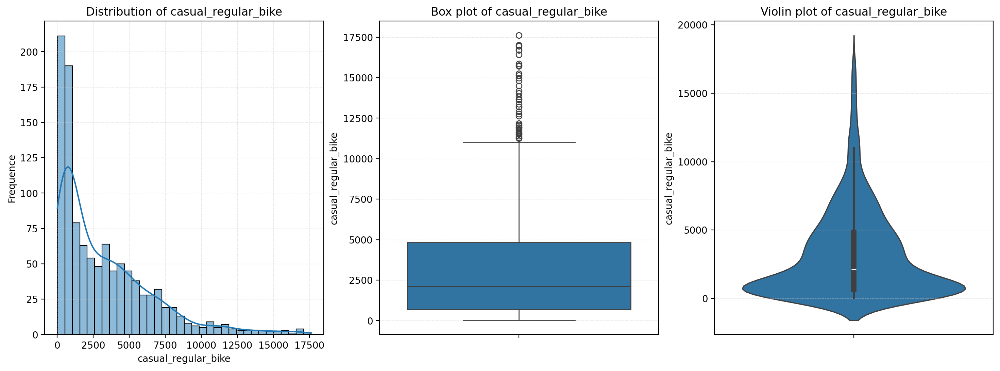


Step 2: Searching for best feature + transformation combo...


  0%|          | 0/26 [00:00<?, ?it/s]


BEST MODELS FOR `casual_regular_bike`

Total combinations: 26
Informative Lags: [1, 3, 5, 6, 7, 13, 14] (threshold = 0.2)

------------------------------------------------------------------------------------------------------------
| N. | Combination                                        | Transformation       | Lags       | MAE        |
------------------------------------------------------------------------------------------------------------
| 1  | time_index, lags                                   | boxcox (λ=0.1829)    | Yes        | 737.62     |
------------------------------------------------------------------------------------------------------------
| 2  | time_index, timestamps                             | boxcox (λ=0.1829)    | No         | 842.22     |
------------------------------------------------------------------------------------------------------------
| 3  | time_index, holidays                               | boxcox (λ=0.1829)    | No         | 1781.90    |
----

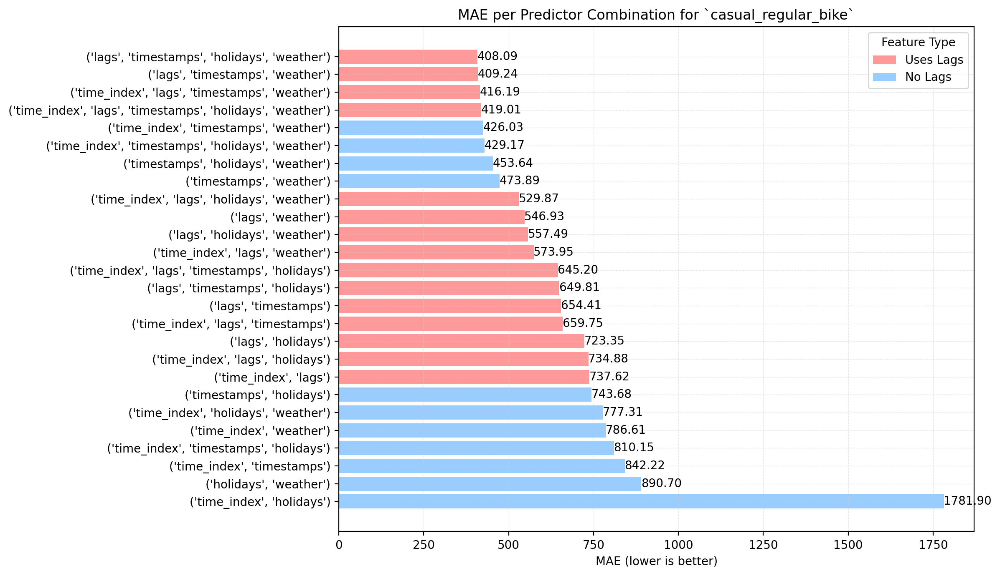


Step 4: Extracting best model based on MAE

Step 5: Forecast visualization and feature importance


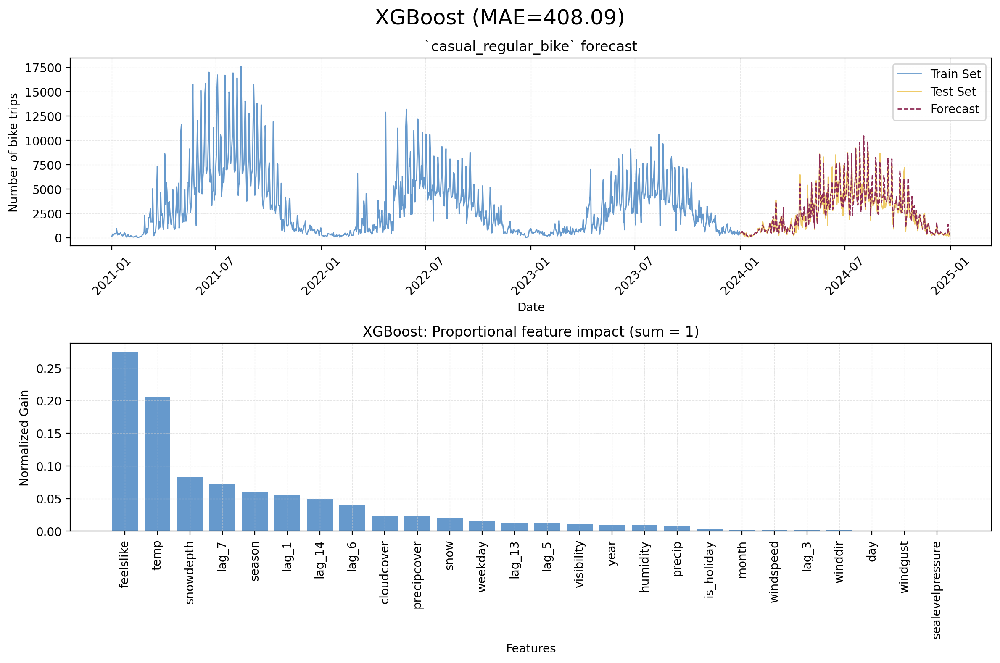


Step 6: Residual analysis


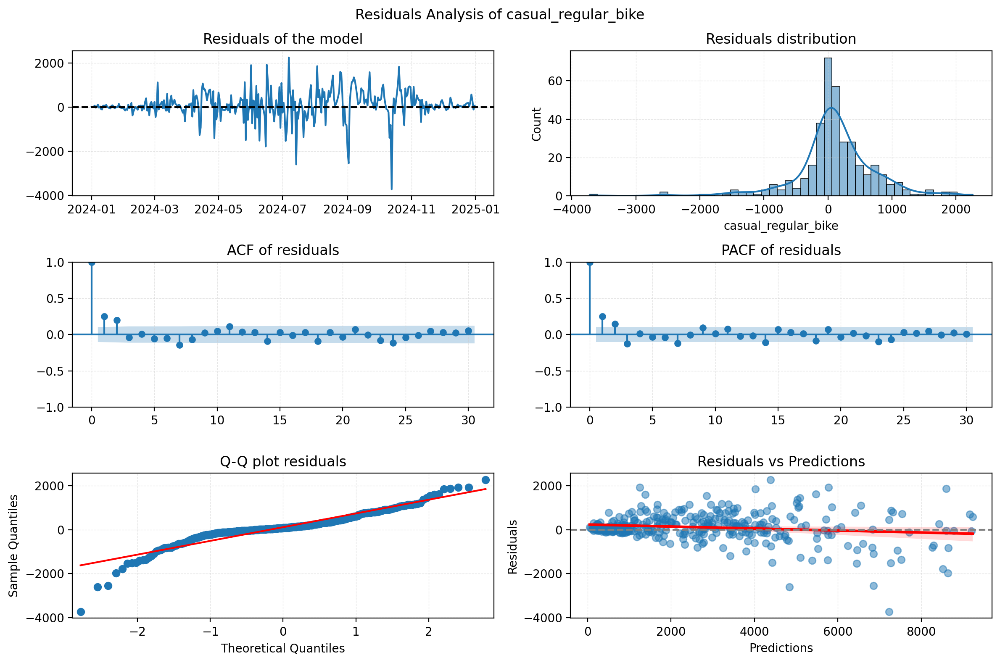


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10  51.4729     0.0000
Residuals are autocorrelated

-- Dickey–Fuller test --
ADF Statistic: -10.057612384470433
p-value: 1.359910558896157e-17
Time series is stationary

-- KPSS test --
ADF Statistic: 0.050741282445359456
p-value: 0.1
Time series is stationary


/Users/dmitry_luchkin/Documents/00_My_Documents/01_Projects/02_Doing/XX_Divvy_bike_sharing_forecast/01_notebooks/../02_scripts/utils/plotting/viz.py:231: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(residuals, regression='ct')


In [23]:
xgb_casual_regular_predictors, xgb_casual_regular_model = xgb_run(train, test, "casual_regular_bike")

##### Member/Regular


Step 1: Analyzing distribution of `member_regular_bike`

[`member_regular_bike`]
Skewness: 0.07

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis: -1.22

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


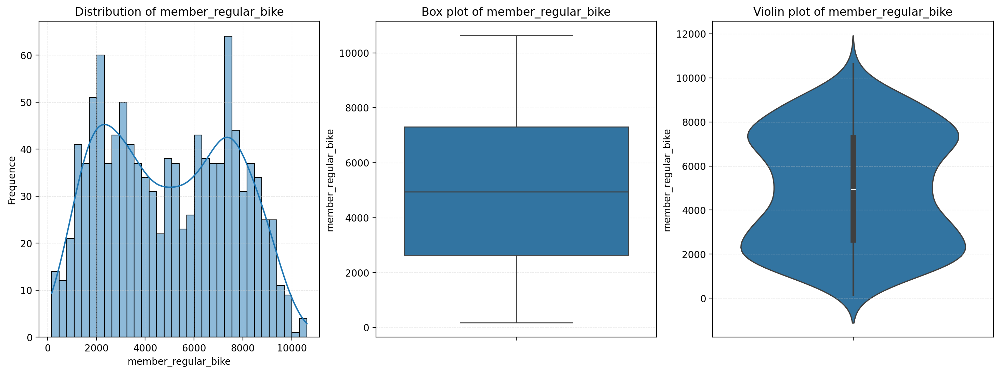


Step 2: Searching for best feature + transformation combo...


  0%|          | 0/26 [00:00<?, ?it/s]


BEST MODELS FOR `member_regular_bike`

Total combinations: 26
Informative Lags: [1, 2, 6] (threshold = 0.2)

------------------------------------------------------------------------------------------------------------
| N. | Combination                                        | Transformation       | Lags       | MAE        |
------------------------------------------------------------------------------------------------------------
| 1  | time_index, lags                                   | boxcox (λ=0.6761)    | Yes        | 863.34     |
------------------------------------------------------------------------------------------------------------
| 2  | time_index, timestamps                             | -                    | No         | 858.46     |
------------------------------------------------------------------------------------------------------------
| 3  | time_index, holidays                               | -                    | No         | 1801.75    |
------------------

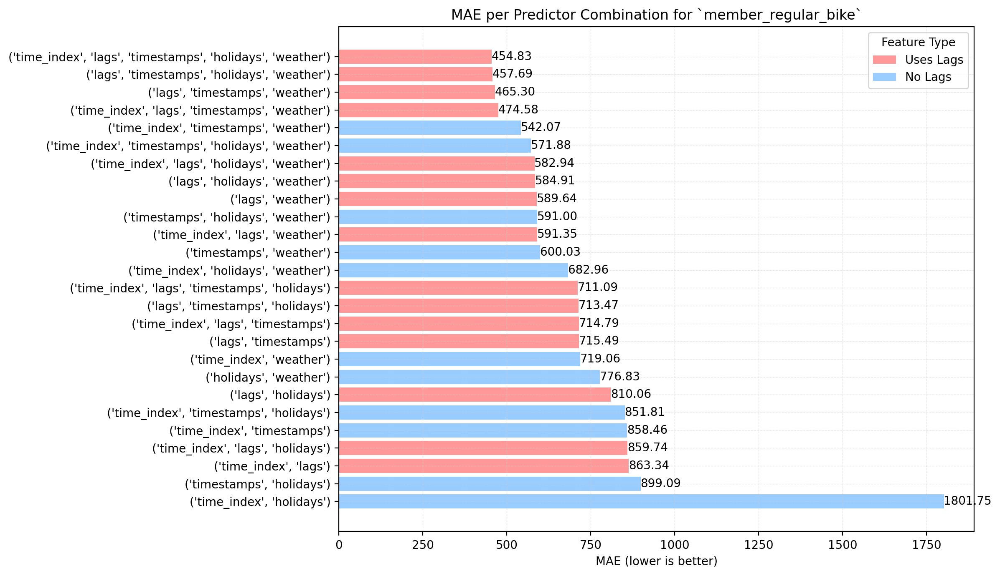


Step 4: Extracting best model based on MAE

Step 5: Forecast visualization and feature importance


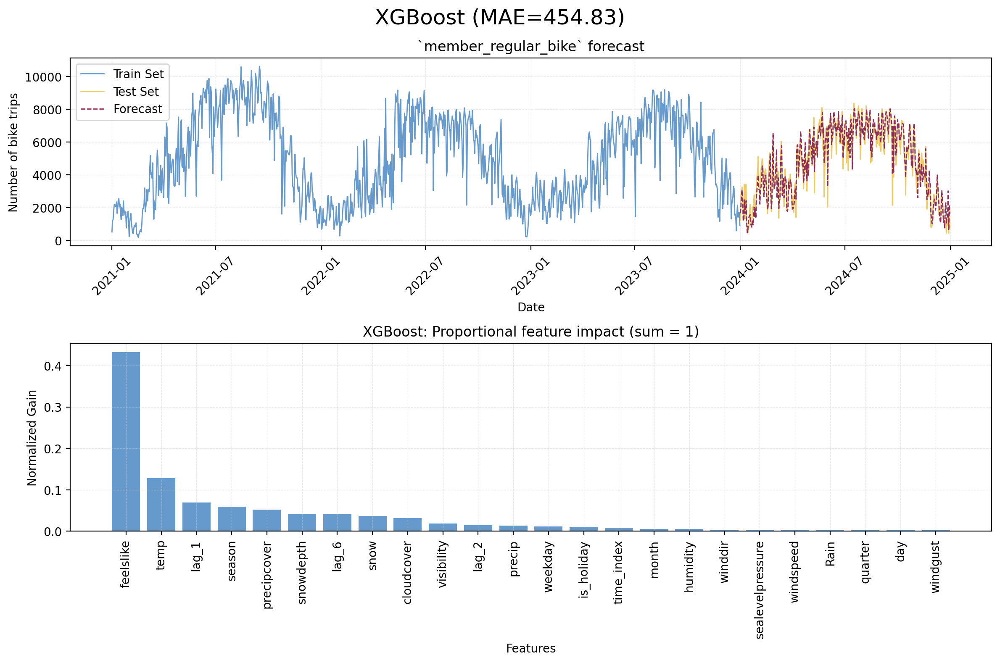


Step 6: Residual analysis


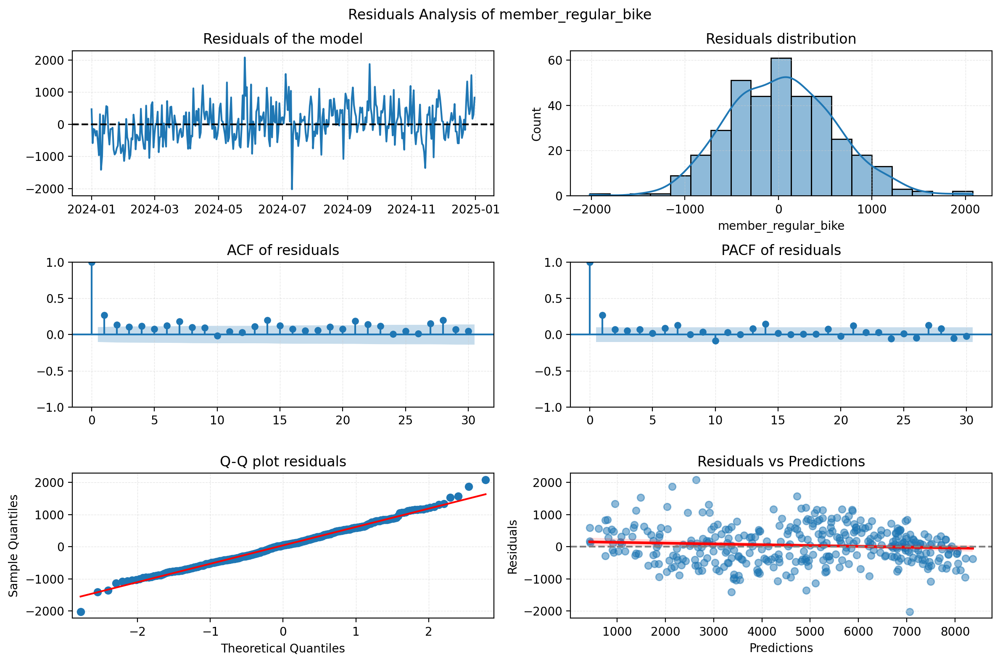


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10  69.7289     0.0000
Residuals are autocorrelated

-- Dickey–Fuller test --
ADF Statistic: -3.01900104205237
p-value: 0.03315764174959114
Time series is stationary

-- KPSS test --
ADF Statistic: 0.2766515113646849
p-value: 0.01
Time series is non stationary


/Users/dmitry_luchkin/Documents/00_My_Documents/01_Projects/02_Doing/XX_Divvy_bike_sharing_forecast/01_notebooks/../02_scripts/utils/plotting/viz.py:231: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  result = kpss(residuals, regression='ct')


In [24]:
xgb_member_regular_predictors, xgb_member_regular_model = xgb_run(train, test, "member_regular_bike")

##### Casual/Electric


Step 1: Analyzing distribution of `casual_electric_bike`

[`casual_electric_bike`]
Skewness: 0.6

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis: -0.46

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


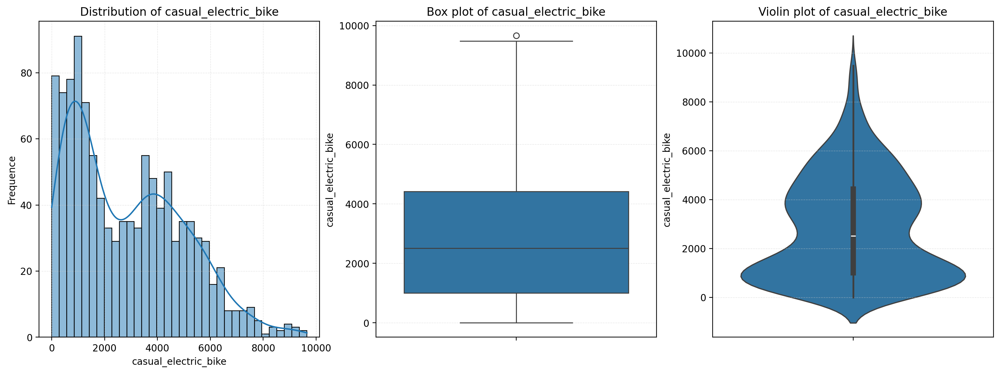


Step 2: Searching for best feature + transformation combo...


  0%|          | 0/26 [00:00<?, ?it/s]


BEST MODELS FOR `casual_electric_bike`

Total combinations: 26
Informative Lags: [1, 3, 5, 6, 7] (threshold = 0.2)

------------------------------------------------------------------------------------------------------------
| N. | Combination                                        | Transformation       | Lags       | MAE        |
------------------------------------------------------------------------------------------------------------
| 1  | time_index, lags                                   | -                    | Yes        | 713.89     |
------------------------------------------------------------------------------------------------------------
| 2  | time_index, timestamps                             | log1p                | No         | 1118.30    |
------------------------------------------------------------------------------------------------------------
| 3  | time_index, holidays                               | -                    | No         | 1973.67    |
-----------

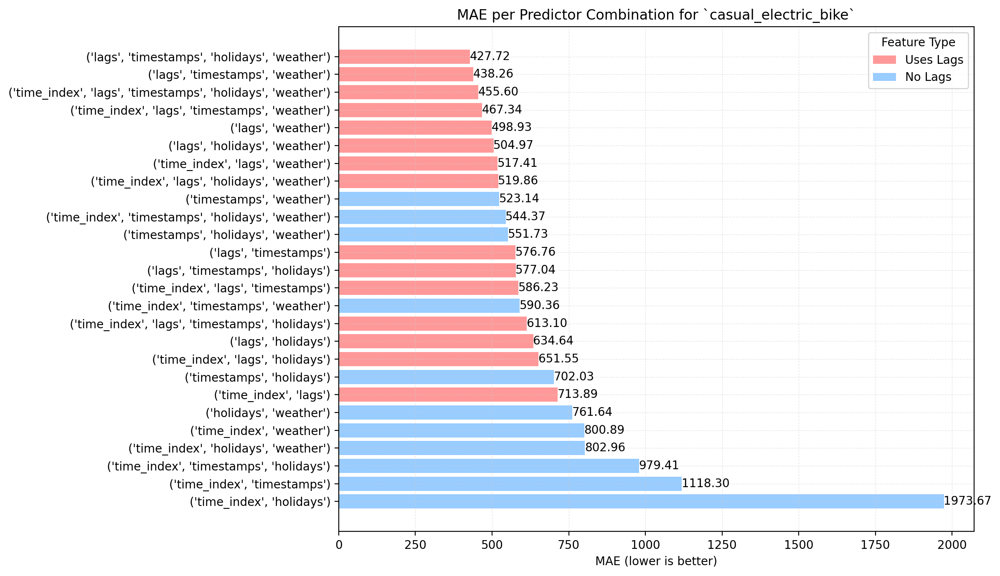


Step 4: Extracting best model based on MAE

Step 5: Forecast visualization and feature importance


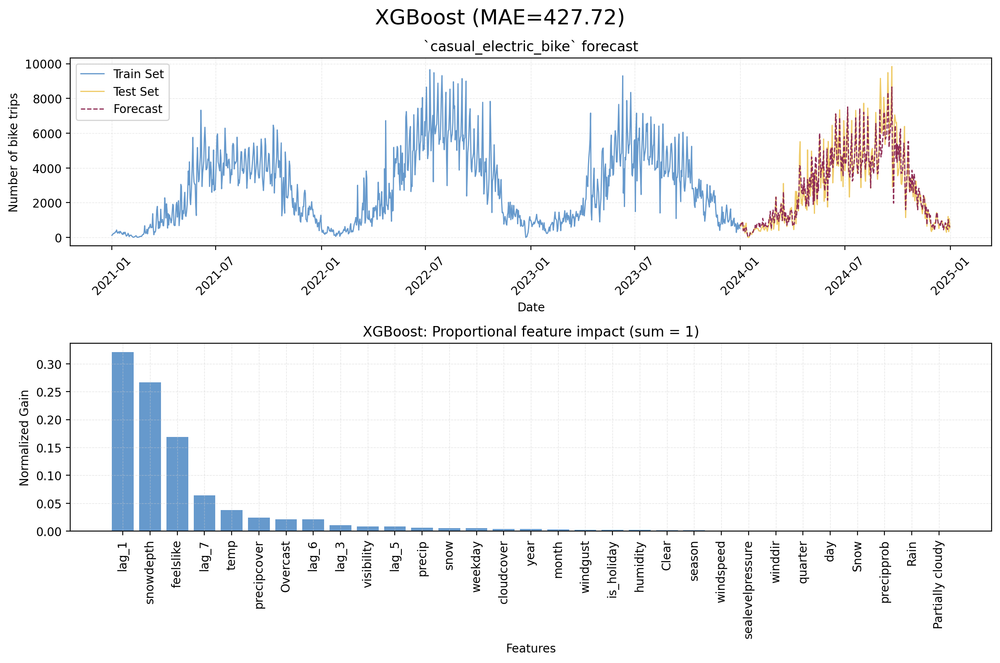


Step 6: Residual analysis


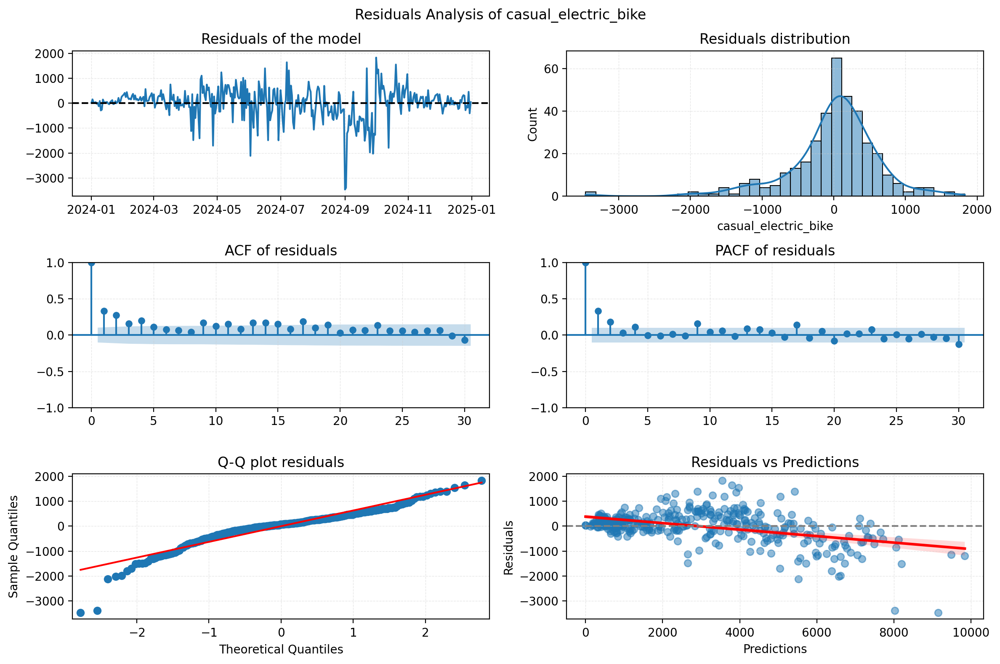


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10 116.9781     0.0000
Residuals are autocorrelated

-- Dickey–Fuller test --
ADF Statistic: -6.536383000609678
p-value: 9.58558896646892e-09
Time series is stationary

-- KPSS test --
ADF Statistic: 0.1673425882568156
p-value: 0.032214509785986986
Time series is non stationary


In [25]:
xgb_casual_electric_predictors, xgb_casual_electric_model = xgb_run(train, test, "casual_electric_bike")

##### Member/Electric


Step 1: Analyzing distribution of `member_electric_bike`

[`member_electric_bike`]
Skewness: 0.13

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis: -0.98

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


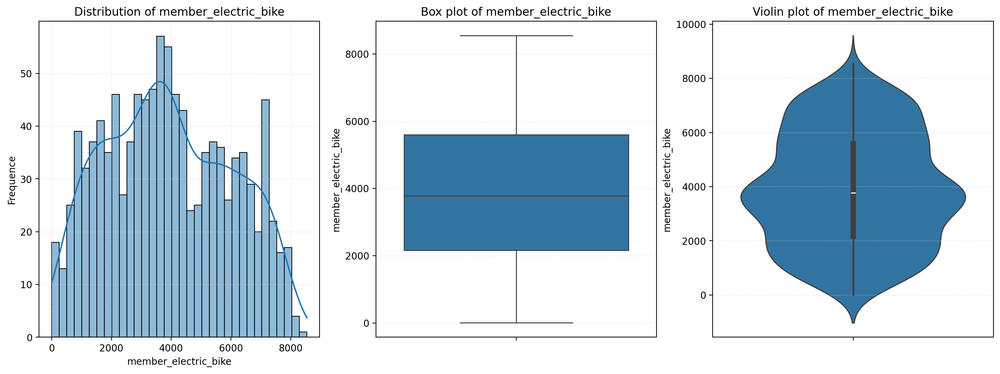


Step 2: Searching for best feature + transformation combo...


  0%|          | 0/26 [00:00<?, ?it/s]


BEST MODELS FOR `member_electric_bike`

Total combinations: 26
Informative Lags: [1, 5, 6] (threshold = 0.2)

------------------------------------------------------------------------------------------------------------
| N. | Combination                                        | Transformation       | Lags       | MAE        |
------------------------------------------------------------------------------------------------------------
| 1  | time_index, lags                                   | -                    | Yes        | 954.56     |
------------------------------------------------------------------------------------------------------------
| 2  | time_index, timestamps                             | boxcox (λ=0.7057)    | No         | 1197.67    |
------------------------------------------------------------------------------------------------------------
| 3  | time_index, holidays                               | -                    | No         | 2973.72    |
-----------------

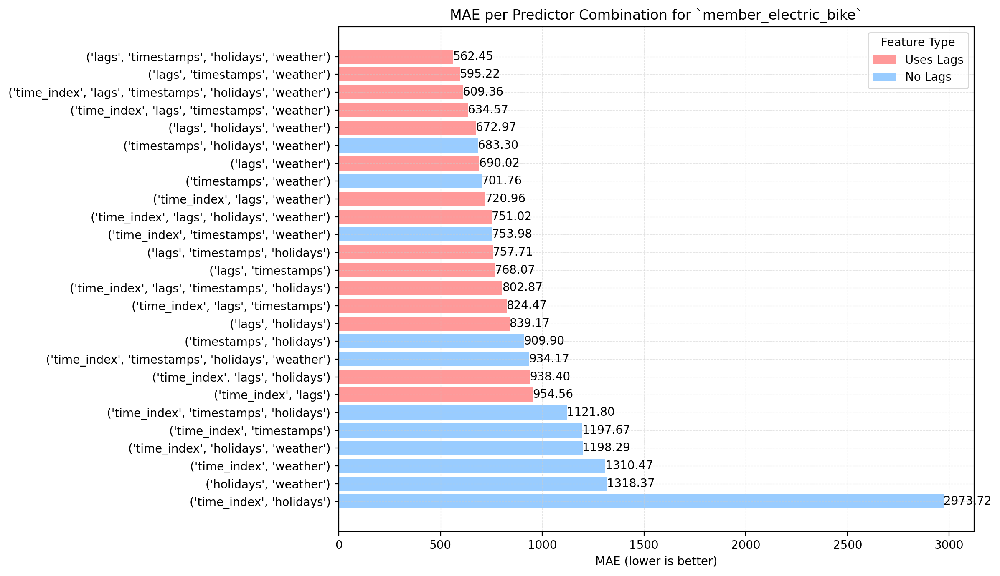


Step 4: Extracting best model based on MAE

Step 5: Forecast visualization and feature importance


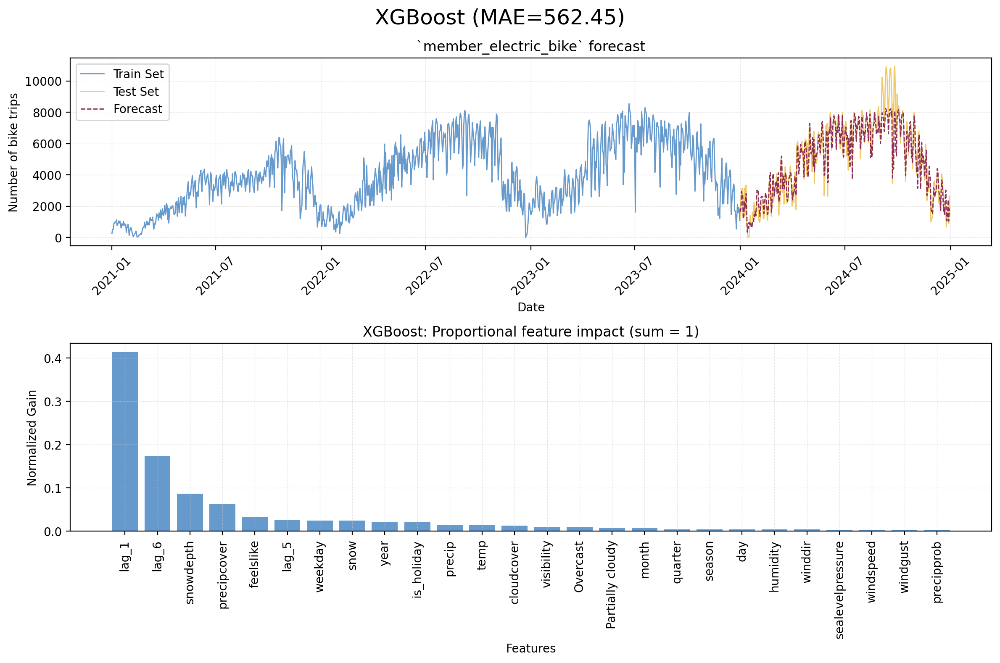


Step 6: Residual analysis


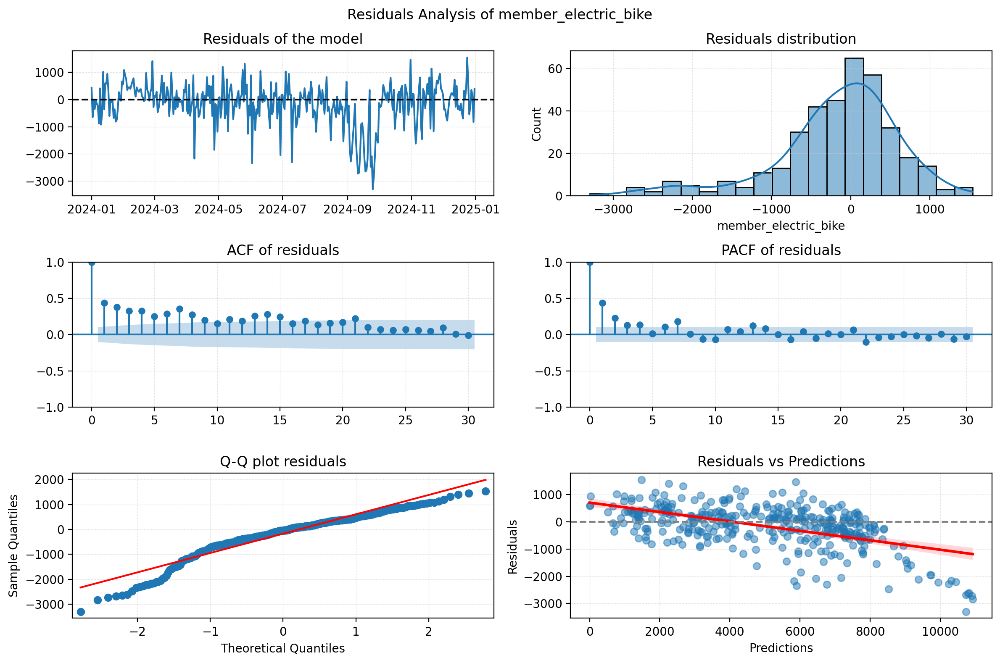


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10 355.4696     0.0000
Residuals are autocorrelated

-- Dickey–Fuller test --
ADF Statistic: -3.4995052530161352
p-value: 0.007999809306801204
Time series is stationary

-- KPSS test --
ADF Statistic: 0.21400692404570043
p-value: 0.010747403482862338
Time series is non stationary


In [26]:
xgb_member_electric_predictors, xgb_member_electric_model = xgb_run(train, test, "member_electric_bike")

In [27]:
# keep MAEs to compare
xgb_mae_scores['bottom-up']['mae']['casual_regular_bike'] = xgb_casual_regular_model["test_mae"]
xgb_mae_scores['bottom-up']['mae']['member_regular_bike'] = xgb_member_regular_model["test_mae"]
xgb_mae_scores['bottom-up']['mae']['casual_electric_bike'] = xgb_casual_electric_model["test_mae"]
xgb_mae_scores['bottom-up']['mae']['member_electric_bike'] = xgb_member_electric_model["test_mae"]

##### Lower-level forecasting viz

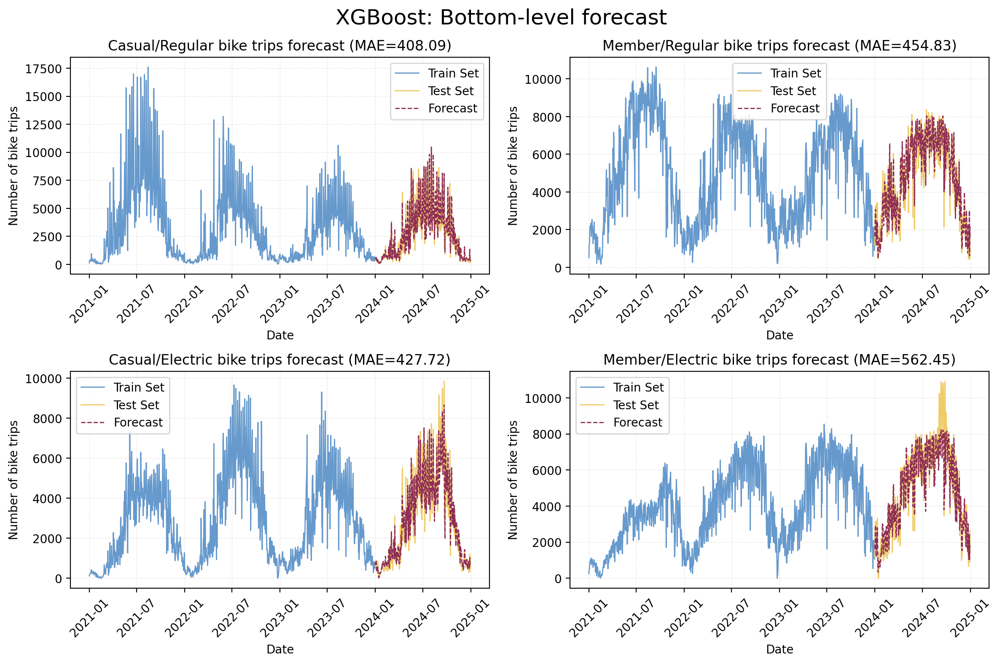

In [28]:
fig, ax = plt.subplots(2, 2, figsize=(12, 8))

plot_trips(train=train["casual_regular_bike"], 
                    test=test["casual_regular_bike"],
                    forecast=pd.DataFrame(xgb_casual_regular_model["test_forecast"], test.index),
                    title=f"Casual/Regular bike trips forecast (MAE={xgb_casual_regular_model["test_mae"]:.2f})",
                    ax=ax[0, 0])

plot_trips(train=train["member_regular_bike"], 
                    test=test["member_regular_bike"],
                    forecast=pd.DataFrame(xgb_member_regular_model["test_forecast"], test.index),
                    title=f"Member/Regular bike trips forecast (MAE={xgb_member_regular_model["test_mae"]:.2f})",
                    ax=ax[0, 1])

plot_trips(train=train["casual_electric_bike"], 
                    test=test["casual_electric_bike"],
                    forecast=pd.DataFrame(xgb_casual_electric_model["test_forecast"], test.index),
                    title=f"Casual/Electric bike trips forecast (MAE={xgb_casual_electric_model["test_mae"]:.2f})",
                    ax=ax[1, 0])

plot_trips(train=train["member_electric_bike"], 
                    test=test["member_electric_bike"],
                    forecast=pd.DataFrame(xgb_member_electric_model["test_forecast"], test.index),
                    title=f"Member/Electric bike trips forecast (MAE={xgb_member_electric_model["test_mae"]:.2f})",
                    ax=ax[1, 1])

plt.suptitle("XGBoost: Bottom-level forecast", fontsize=18)
plt.tight_layout()
plt.show()

##### Sub-Total forecasting (Bottom-Up)

In [29]:
bu_casual_total_forecast = xgb_casual_regular_model["test_forecast"] + \
                            xgb_casual_electric_model["test_forecast"]
bu_member_total_forecast = xgb_member_regular_model["test_forecast"] + \
                            xgb_member_electric_model["test_forecast"]
bu_electric_total_forecast = xgb_member_electric_model["test_forecast"] + \
                              xgb_casual_electric_model["test_forecast"]
bu_regular_total_forecast = xgb_casual_regular_model["test_forecast"] + \
                             xgb_member_regular_model["test_forecast"]

bu_casual_total_mae = mean_absolute_error(test['casual_total'], bu_casual_total_forecast)
bu_member_total_mae = mean_absolute_error(test['member_total'], bu_member_total_forecast)
bu_electric_total_mae = mean_absolute_error(test['electric_total'], bu_electric_total_forecast)
bu_regular_total_mae = mean_absolute_error(test['regular_total'], bu_regular_total_forecast)

In [30]:
xgb_mae_scores['bottom-up']['mae']['casual_total'] = bu_casual_total_mae
xgb_mae_scores['bottom-up']['mae']['member_total'] = bu_member_total_mae
xgb_mae_scores['bottom-up']['mae']['electric_total'] = bu_electric_total_mae
xgb_mae_scores['bottom-up']['mae']['regular_total'] = bu_regular_total_mae

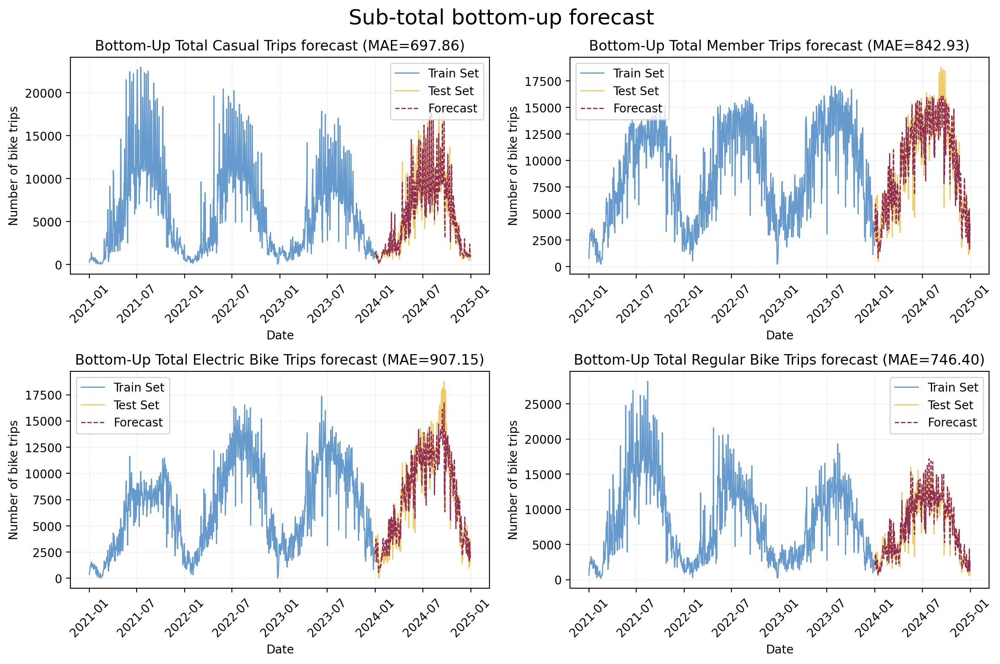

In [31]:
fig, ax = plt.subplots(2, 2, figsize=(12, 8))

plot_trips(train=train["casual_total"], 
                    test=test["casual_total"],
                    forecast=pd.DataFrame(bu_casual_total_forecast, test.index),
                    title=f"Bottom-Up Total Casual Trips forecast (MAE={bu_casual_total_mae:.2f})",
                    ax=ax[0, 0])

plot_trips(train=train["member_total"], 
                    test=test["member_total"],
                    forecast=pd.DataFrame(bu_member_total_forecast, test.index),
                    title=f"Bottom-Up Total Member Trips forecast (MAE={bu_member_total_mae:.2f})",
                    ax=ax[0, 1])

plot_trips(train=train["electric_total"], 
                    test=test["electric_total"],
                    forecast=pd.DataFrame(bu_electric_total_forecast, test.index),
                    title=f"Bottom-Up Total Electric Bike Trips forecast (MAE={bu_electric_total_mae:.2f})",
                    ax=ax[1, 0])

plot_trips(train=train["regular_total"], 
                    test=test["regular_total"],
                    forecast=pd.DataFrame(bu_regular_total_forecast, test.index),
                    title=f"Bottom-Up Total Regular Bike Trips forecast (MAE={bu_regular_total_mae:.2f})",
                    ax=ax[1, 1])

plt.suptitle("Sub-total bottom-up forecast", fontsize=18)
plt.tight_layout()
plt.show()

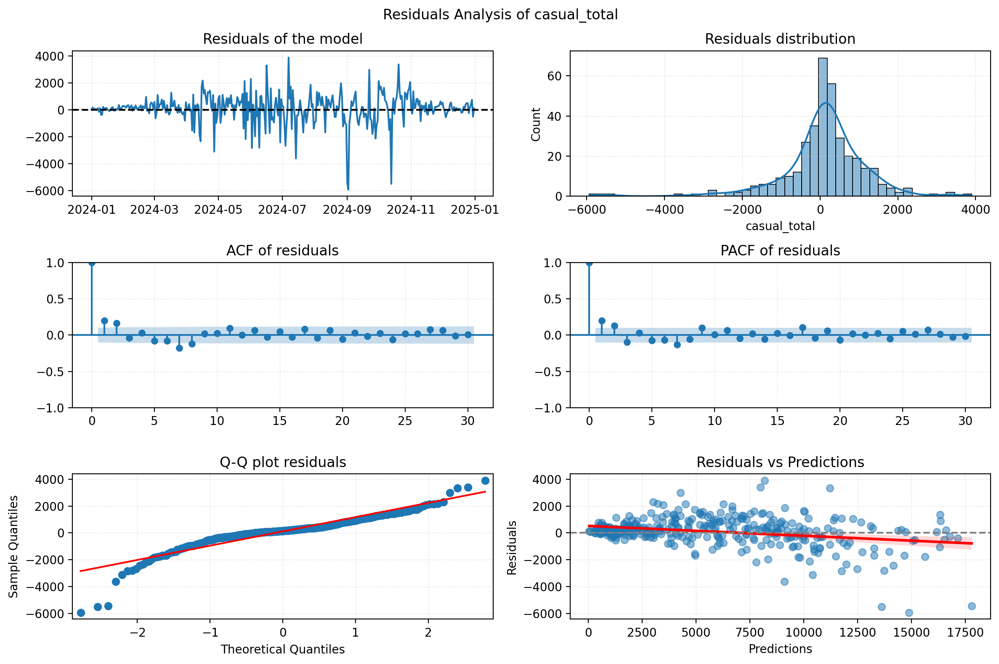


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10  47.4573     0.0000
Residuals are autocorrelated

-- Dickey–Fuller test --
ADF Statistic: -6.802989504504341
p-value: 2.212693176525271e-09
Time series is stationary

-- KPSS test --
ADF Statistic: 0.06529754572140778
p-value: 0.1
Time series is stationary


/Users/dmitry_luchkin/Documents/00_My_Documents/01_Projects/02_Doing/XX_Divvy_bike_sharing_forecast/01_notebooks/../02_scripts/utils/plotting/viz.py:231: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  result = kpss(residuals, regression='ct')


In [32]:
check_residuals(bu_casual_total_forecast, test["casual_total"], "casual_total")

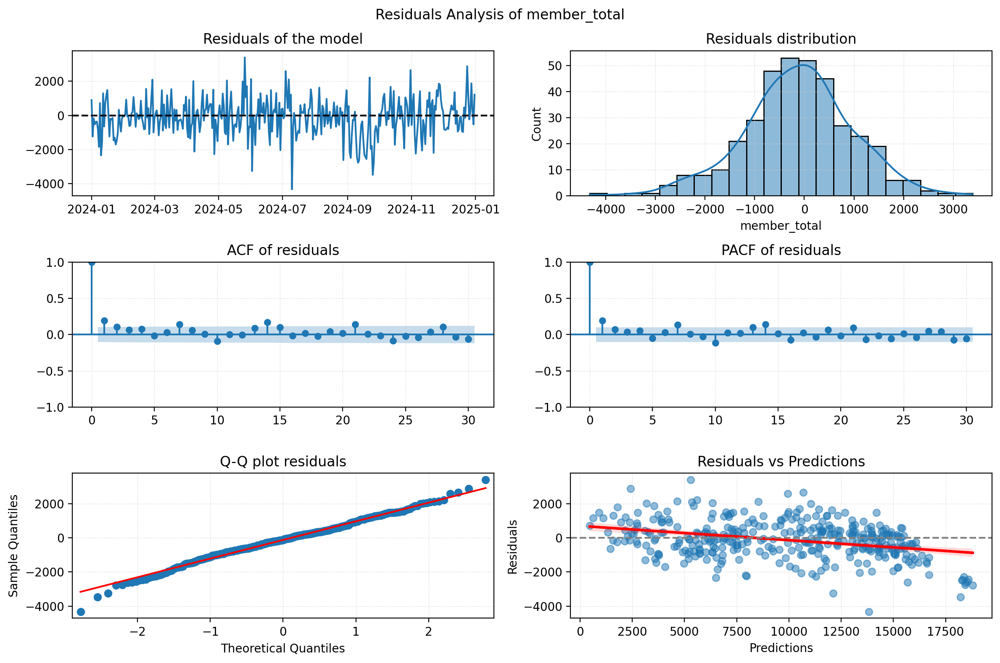


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10  34.6144     0.0001
Residuals are autocorrelated

-- Dickey–Fuller test --
ADF Statistic: -3.4443793901307806
p-value: 0.009535869960165894
Time series is stationary

-- KPSS test --
ADF Statistic: 0.14973236672352144
p-value: 0.04688969439706546
Time series is non stationary


In [33]:
check_residuals(bu_member_total_forecast, test["member_total"], "member_total")

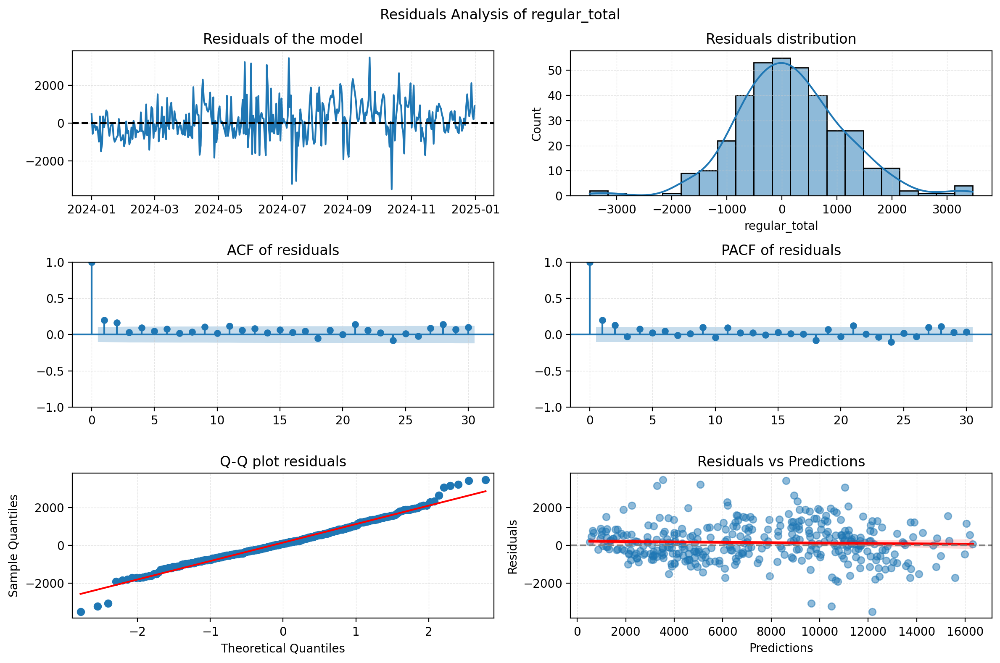


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10  36.3952     0.0001
Residuals are autocorrelated

-- Dickey–Fuller test --
ADF Statistic: -10.545943613029486
p-value: 8.413071998551601e-19
Time series is stationary

-- KPSS test --
ADF Statistic: 0.14829896391147782
p-value: 0.048084196740435146
Time series is non stationary


In [34]:
check_residuals(bu_regular_total_forecast, test["regular_total"], "regular_total")

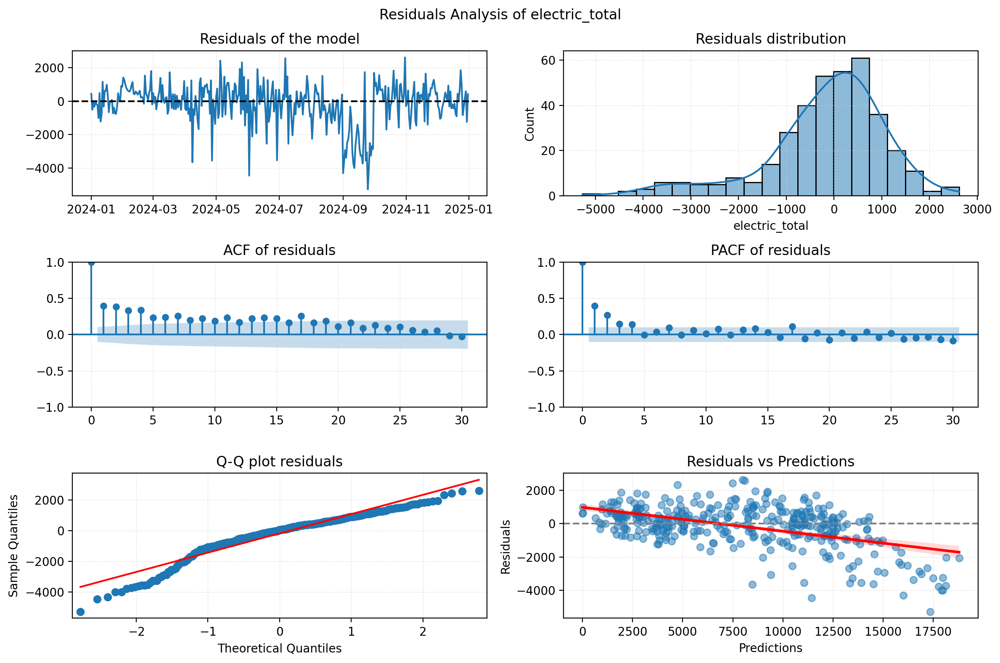


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10 308.3310     0.0000
Residuals are autocorrelated

-- Dickey–Fuller test --
ADF Statistic: -5.154904241121798
p-value: 1.0860450629714568e-05
Time series is stationary

-- KPSS test --
ADF Statistic: 0.20536404219551224
p-value: 0.013988484176682909
Time series is non stationary


In [35]:
check_residuals(bu_electric_total_forecast, test["electric_total"], "electric_total")

##### Total forecasting (Bottom-Up)

In [36]:
bu_total_forecast = xgb_casual_regular_model["test_forecast"] + \
                     xgb_casual_electric_model["test_forecast"] + \
                      xgb_member_electric_model["test_forecast"] + \
                       xgb_member_regular_model["test_forecast"]


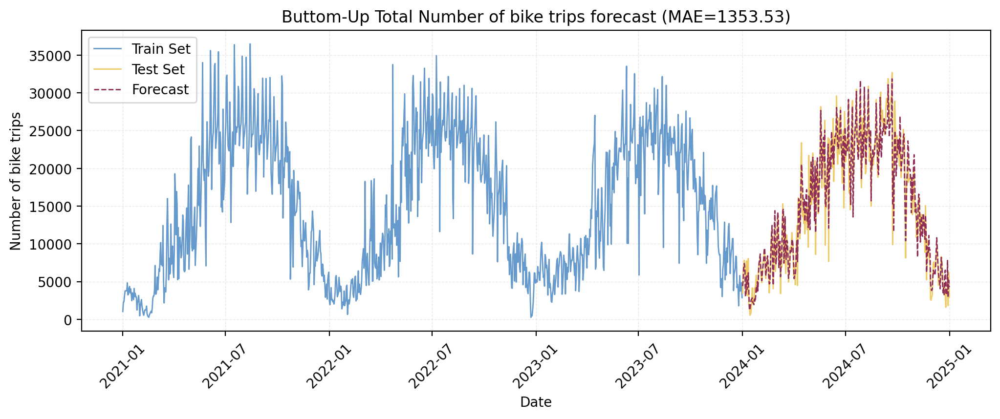

In [37]:
bu_total_mae = mean_absolute_error(test["total_rides"], bu_total_forecast)

# Viz the forecast
_, ax = plt.subplots(1, 1, figsize=(12, 4))
plot_trips(ax, train["total_rides"], test["total_rides"], 
           forecast=pd.DataFrame(bu_total_forecast, index=test.index),
           title=f"Buttom-Up Total Number of bike trips forecast (MAE={bu_total_mae:.2f})")

plt.show()

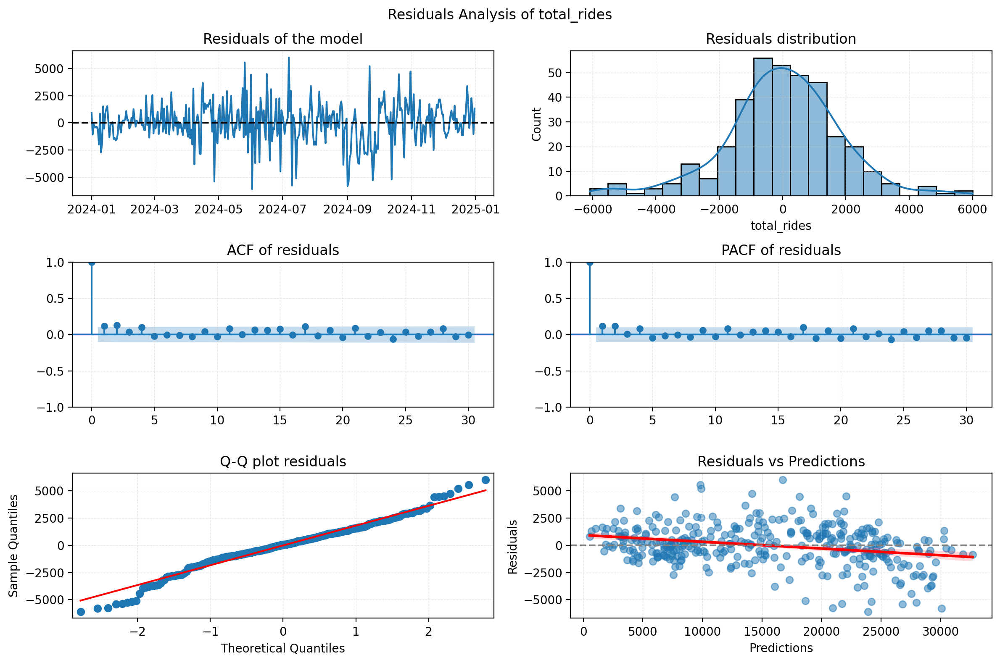


--- Ljung-Box Test ---
    lb_stat  lb_pvalue
10  16.5957     0.0838
Residuals do not show significant autocorrelation

-- Dickey–Fuller test --
ADF Statistic: -11.221092002400157
p-value: 2.0126883518754756e-20
Time series is stationary

-- KPSS test --
ADF Statistic: 0.1307745007373641
p-value: 0.07819536900488128
Time series is stationary


In [38]:
check_residuals(bu_total_forecast, test["total_rides"], "total_rides")

In [39]:
xgb_mae_scores['bottom-up']['mae']['total_rides'] = bu_total_mae

#### Conclusions

In [40]:
xgb_mae_scores_df = pd.DataFrame({method: values['mae'] for method, values in xgb_mae_scores.items()})
xgb_mae_scores_df.index.name= "MAE"

xgb_mae_scores_df

,bottom-up,top-down
MAE,,
total_rides,"1,353.5334","1,435.8649"
regular_total,746.3969,"1,337.6546"
electric_total,907.1503,"1,301.2651"
casual_total,697.8636,"1,682.9259"
member_total,842.9306,"1,588.9889"
casual_regular_bike,408.0877,"1,147.3756"
member_regular_bike,454.8271,911.8556
casual_electric_bike,427.7171,753.3644
member_electric_bike,562.4547,"1,174.4031"


Based on the observed $MAE_{total (bottom-up)} = 1353.53$ (against $MAE_{total (top-down)} = 1435.86$), it is evident that the **bottom-up** approach provides much more accurate forecasting compared to top-down — not only at the top (overall) level but also across intermediate (crossed) aggregation levels. This confirms that building forecasts from the most granular level upward results in better consistency and precision throughout the hierarchy.

---

### Save results

In [43]:
"""
Dump Structure

{
    # Bottom-level entry
    "target_name": {
        "level": "bottom",
        "predictors": (...),               # Tuple of predictors used in training
        "model": {
            "model": <XGBRegressor>,       # Trained model (booster)
            "params": [...],               # Best hyperparameters used
            "transformation": str | None,  # Target transformation (log, log1p, boxcox)
            "test_mae": float,             # Test MAE (after inverse transform)
            "test_forecast": np.ndarray,   # Forecast on test set in original scale
            "lags": list[int] | None,      # Applied lags
            "lambda": float                # Box-Cox λ, if applicable
        }
    },

    # Cross-level or Top-level
    "target_name": {
        "level": "cross|top",
        "sum": [...],                      # Bottom-level keys to sum forecasts from
        "forecast": np.ndarray             # Pre-aggregated forecast
    }
}


"""
xgb_models_dump = {
    "xgboost":{
        # bottom-level
        "casual_regular_bike": {
            "level": "bottom",
            "predictors": xgb_casual_regular_predictors,
            "model": xgb_casual_regular_model
        },
        "casual_electric_bike": {
            "level": "bottom",
            "predictors": xgb_casual_electric_predictors,
            "model": xgb_casual_electric_model
        },
        "member_regular_bike": {
            "level": "bottom",
            "predictors": xgb_member_regular_predictors,
            "model": xgb_member_regular_model
        },
        "member_electric_bike": {
            "level": "bottom",
            "predictors": xgb_member_electric_predictors,
            "model": xgb_member_electric_model
        },
        # cross level
        "casual_total":{
            "level": "cross",
            "sum": ["casual_regular_bike", "casual_electric_bike"],
            "forecast": bu_casual_total_forecast
        },
        "member_total":{
            "level": "cross",
            "sum": ["member_regular_bike", "member_electric_bike"],
            "forecast": bu_member_total_forecast
        },
        "electric_total":{
            "level": "cross",
            "sum": ["member_electric_bike", "casual_electric_bike"],
            "forecast": bu_electric_total_forecast
        },
        "regular_total":{
            "level": "cross",
            "sum": ["member_regular_bike", "casual_regular_bike"],
            "forecast": bu_regular_total_forecast
        },
        # top-level
        "total_rides":{
            "level": "top",
            "sum": ["member_regular_bike", "casual_regular_bike", "member_electric_bike", "casual_electric_bike"],
            "forecast": bu_total_forecast
        },
    }
}

In [44]:
dirname = "../03_models/01_xgboost/"
with open(dirname + "xgboost_models_dump.pkl", "wb") as f:
    pickle.dump(xgb_models_dump, f)


---
\
[__<< Feature Engineering__](./04_Divvy_feature_engineering.ipynb) | [__Home__](../README.md)
\
\
Divvy: Bike Sharing Forecast, _April 2025_